In [1]:
import keras_ocr
import pytesseract
import matplotlib.pyplot as plt
import glob
import os

print(keras_ocr.__version__)
print(pytesseract.__version__)
# pytesseract는 tesseract-ocr에 종속적입니다. 아래 명령어를 통해 설치해야 할 수도 있습니다.
# !sudo apt install tesseract-ocr

0.8.8
0.3.8


# Step1. 검증용 데이터셋 준비
OCR 관련해서 오늘 다루어본 주제는 텍스트의 모양과 크기, 배치, 노이즈 등 OCR의 성능에 영향을 미치는 요인들에 관한 것이었습니다. 여러분들은 위 3가지 기능들이 이미지에 나타난 특징에 따라 얼마나 정확하게 문자를 detect하고 recognize하는지를 검증하기 위한 이미지 데이터를 모아야 합니다. 이미지가 많을수록 좋겠지만 검증해야 할 항목별로 고루 갖춰지는 것도 중요합니다.

가능하다면 함께 학습하는 동료들과 힘을 합쳐보는 것을 추천합니다. 그렇다고 너무 많은 이미지 데이터로 검증하는 것은 이후 결과를 정리하는 것이 힘들 수 있으니 테스트용 이미지는 아무리 많아도 20장을 넘기지 않는 것으로 합시다.

In [2]:
path_list=glob.glob(r"*.jpg")

In [3]:
path_list.sort(key=lambda x:int(os.path.splitext(x)[0]))

In [4]:
path_list

['1.jpg',
 '2.jpg',
 '3.jpg',
 '4.jpg',
 '5.jpg',
 '6.jpg',
 '7.jpg',
 '8.jpg',
 '9.jpg',
 '10.jpg',
 '11.jpg',
 '12.jpg',
 '13.jpg',
 '14.jpg',
 '15.jpg',
 '16.jpg',
 '17.jpg',
 '18.jpg',
 '19.jpg',
 '20.jpg']

# Step2. keras-ocr, Tesseract로 테스트 진행
위 두 가지 모듈을 활용하는 방법에 대해서는 코드 레벨로 이미 경험해 보셨을 것입니다. 이미지 리스트를 정리한 후 반복문을 실행하며 모듈이 출력한 결과를 모아 봅시다.

## keras-ocr 테스트

In [5]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /home/liky/.keras-ocr/craft_mlt_25k.h5


2022-11-11 00:03:30.811541: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-11 00:03:31.250390: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1510] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9838 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:41:00.0, compute capability: 6.1


Looking for /home/liky/.keras-ocr/crnn_kurapan.h5


2022-11-11 00:03:32.896130: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-11-11 00:03:33.631429: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8600
2022-11-11 00:03:34.005729: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


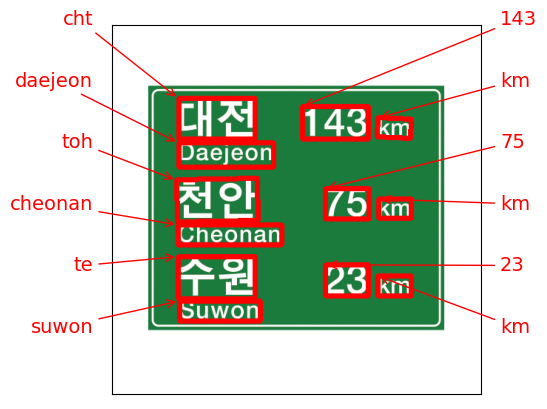

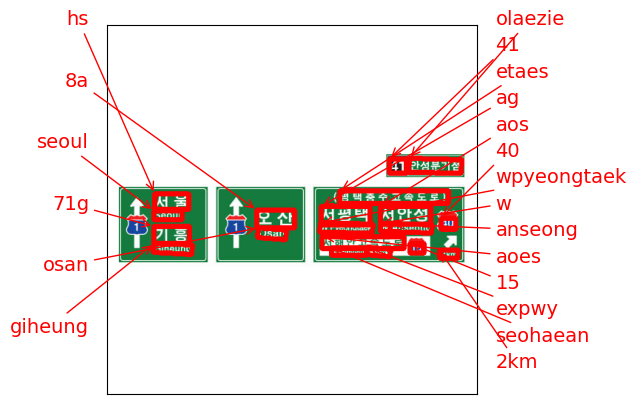

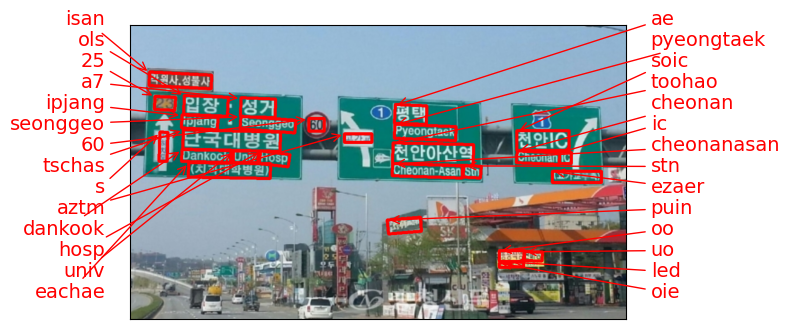

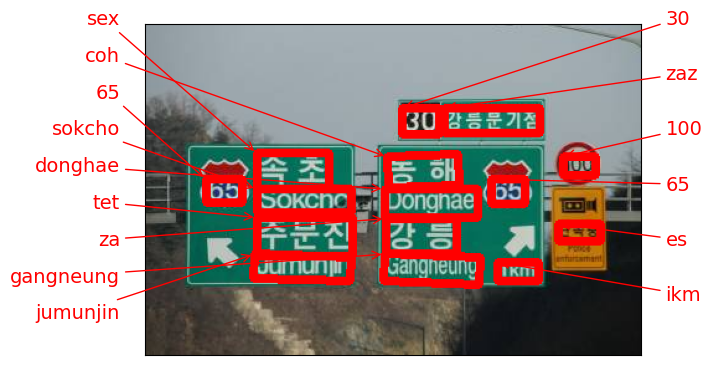

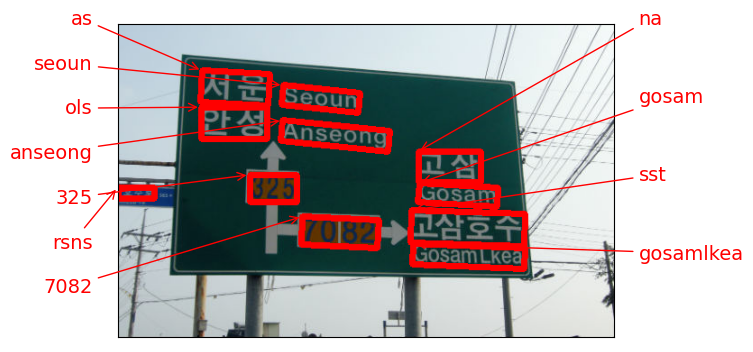

...

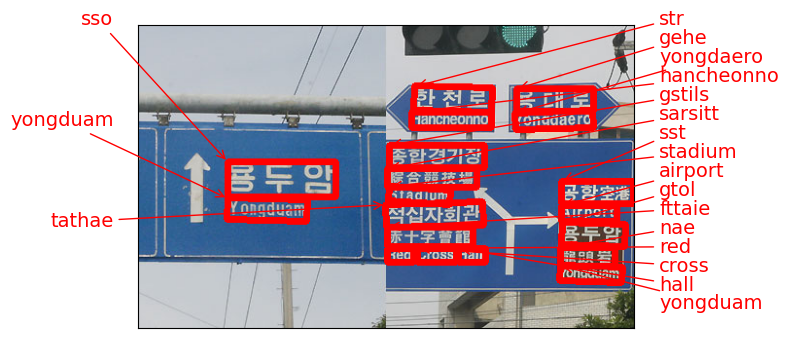

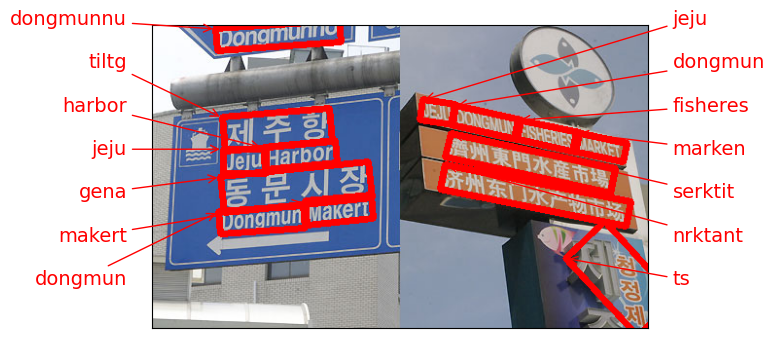

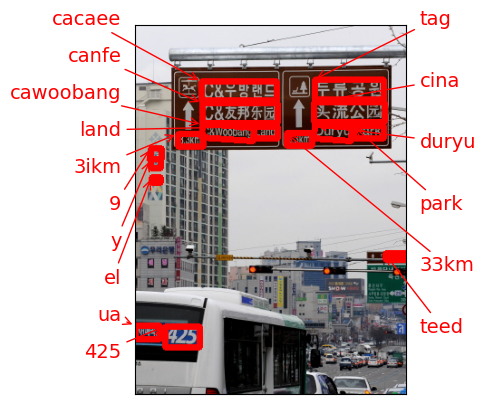

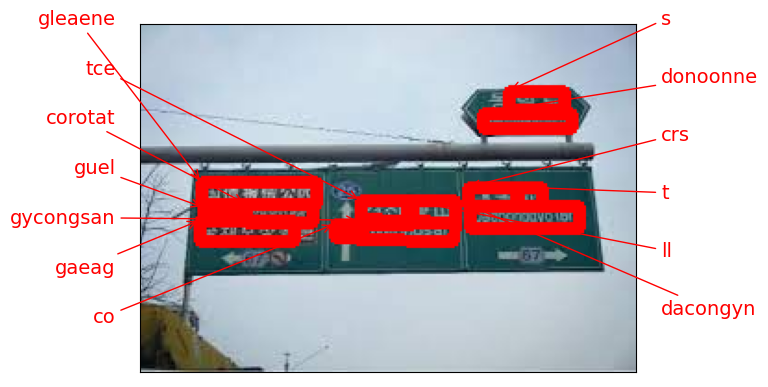

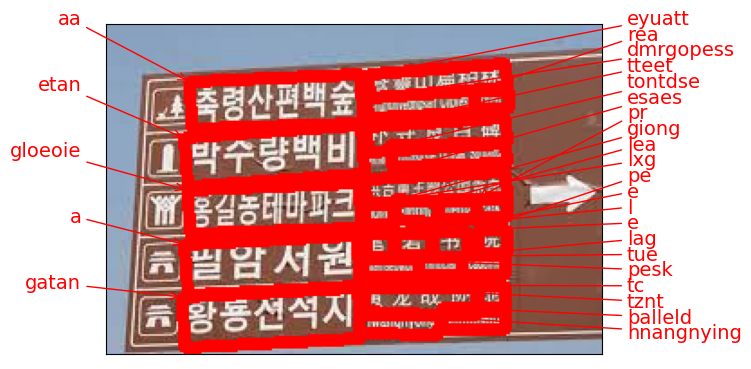

In [6]:
# 20장을 동시에 처리하면 그래픽카드 메모리 부족에러가 자꾸 발생하여 1개씩 인식시키는 방식으로 변경했습니다.
for i in range(len(path_list)):
    img = keras_ocr.tools.read(path_list[i])
    prediction_groups = pipeline.recognize([img])
    keras_ocr.tools.drawAnnotations(image=img, predictions=prediction_groups[0])

## Tesseract 테스트

In [7]:
import cv2
from pytesseract import Output

def get_detected_area_info(image):
    d = pytesseract.image_to_data(image, lang='kor+eng',config='--oem 3 --psm 3',output_type=Output.DICT)
    n_boxes = len(d['text'])
    width = image.shape[1]
    height= image.shape[0]
    top_level = max(d['level'])
    area_list = []
    for i in range(n_boxes):
        if (d['level'][i]==top_level):
            (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
            area_list.append((x, y, w, h))
    return area_list

In [8]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumGothic')

def annotate_detected_area(f_name): 
    img = cv2.imread(f_name)
    if img  is None:
        return None
    img_width=img.shape[1]
    img_height=img.shape[0]
    d_area = get_detected_area_info(img)
    # (x,y,w,h) -> subtuple[1]은 y값을 의미하므로 y값으로 정렬된다 작은값이 맨 위에 위치한다
    d_area = sorted(d_area, key=lambda subtuple:subtuple[1])
    left=[]
    right=[]
    for i in range(len(d_area)):
        (x, y, w, h) = d_area[i]
        if w==0:continue
        if h==0:continue
        if  x < img.shape[1]//2:
            left.append(d_area[i])
        else:
            right.append(d_area[i])
    
    if (len(left)<1) and (len(right)<1):
        print(f_name,'detected_area error=',d_area)
        return None
    
    _,ax = plt.subplots()
    ax.set_title(f_name)
    ax.set_yticks([])
    ax.set_xticks([])
    for side, text_areas in zip(["left","right"],[left,right]):
        for idx,(tx,ty,tw,th) in enumerate(text_areas):
            try:
                crop_img = img[ty:ty+th,tx:tx+tw]
                detect_str = pytesseract.image_to_string(cv2.cvtColor(crop_img,cv2.COLOR_BGR2RGB), lang='kor+eng',config='--oem 3 --psm 7')
                text_height = 1 - (idx/len(text_areas))
                img = cv2.rectangle(img, (tx, ty), (tx + tw, ty + th), (0, 0, 255), 2)
                
                
                ax.annotate(text = str(idx)+'='+detect_str,
                            xy = (tx/img_width,1-(ty/img_height)),
                            xytext=(-0.05 if side=='left' else 1.05, text_height),
                            xycoords="axes fraction",
                            arrowprops={"arrowstyle": "->", "color": "r"},
                            color="r",
                            fontsize=14,
                            horizontalalignment="right" if side == "left" else "left")
                ax.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
            except:
                print('text_area_error',tx,ty,tw,th)
    return ax

In [9]:
annotate_detected_area(path_list[9])

10.jpg detected_area error= [(0, 0, 0, 304)]


10.jpg detected_area error= [(0, 0, 0, 304)]
13.jpg detected_area error= [(0, 1, 0, 472)]
19.jpg detected_area error= [(0, 0, 0, 188)]


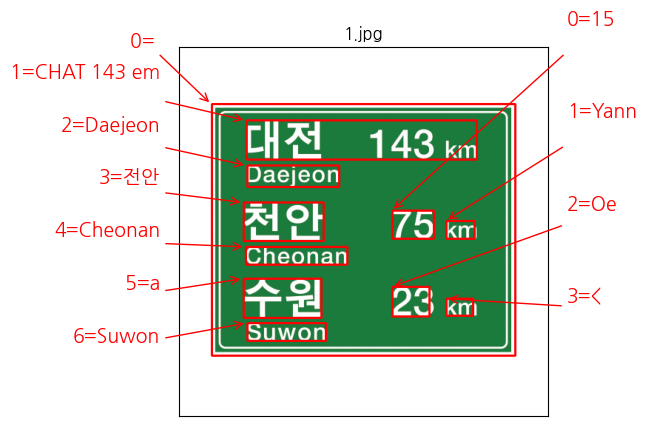

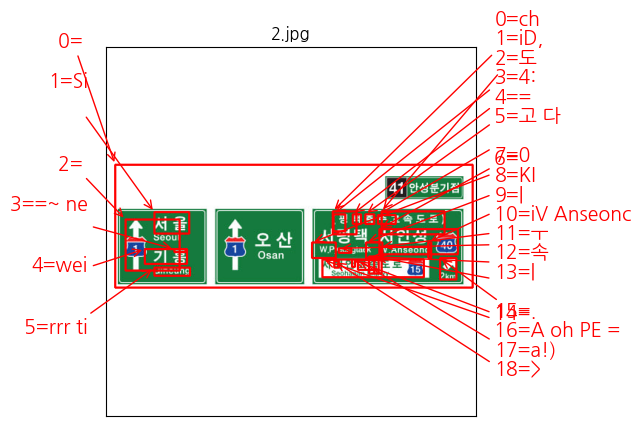

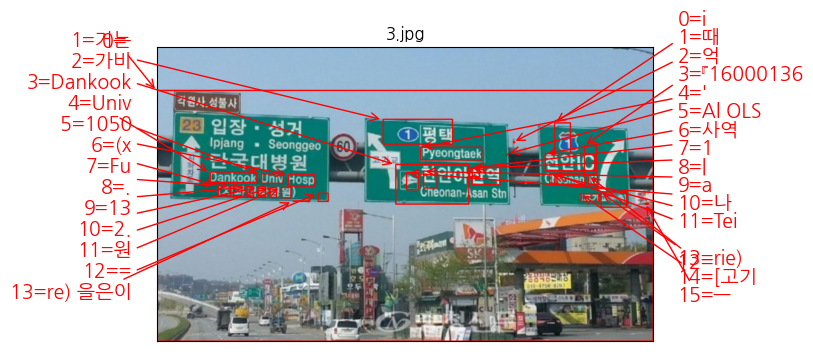

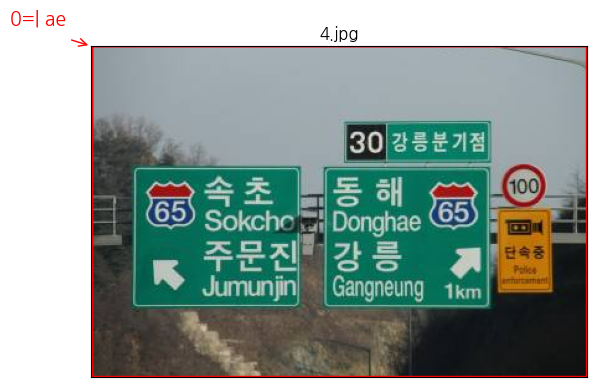

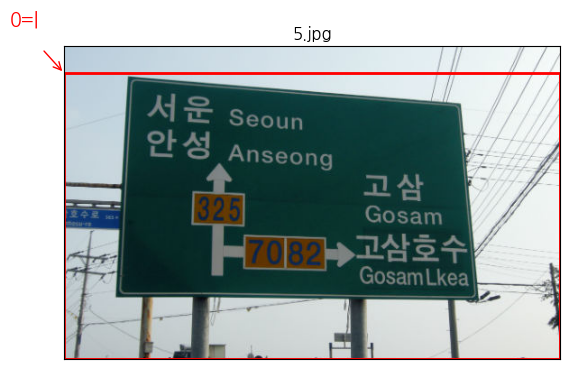

...

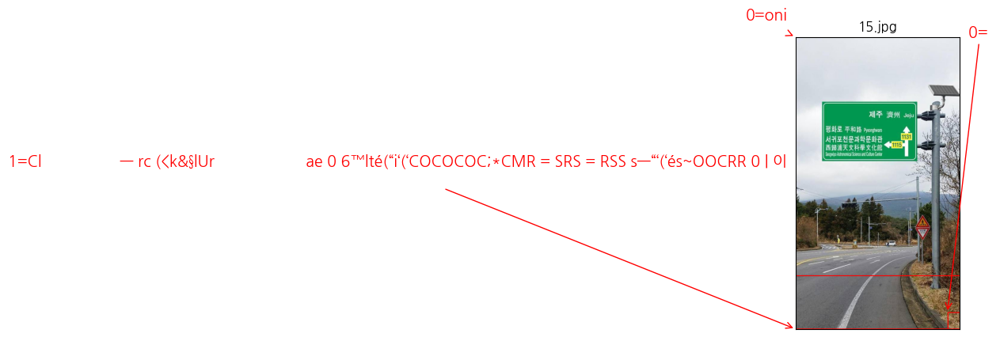

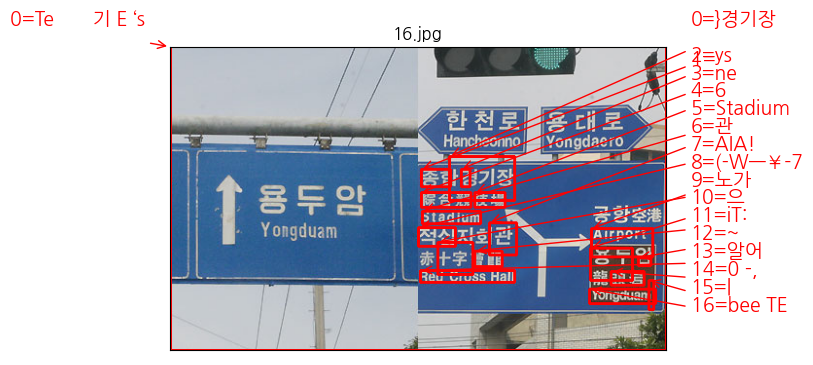

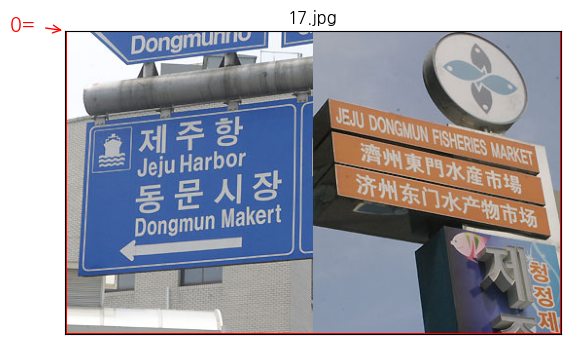

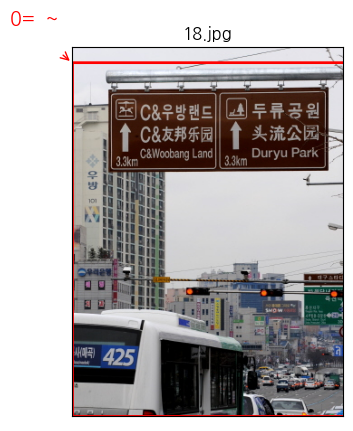

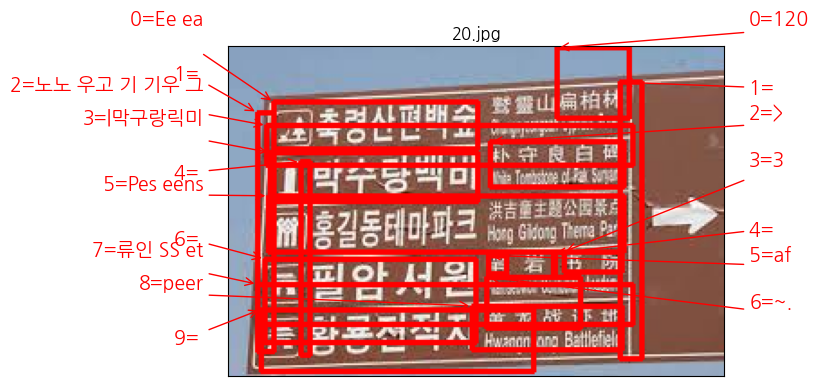

In [10]:
for f_name in path_list:
    annotate_detected_area(f_name)

# Step3. 테스트 결과 정리
모듈들마다 출력 형태가 다릅니다. 분석을 위해 결과를 일목요연하게 정리해 보는 것이 도움이 될 것입니다. 시각화 방법이 함께 활용된다면 더욱 좋겠군요.
## Keras_ocr
#### 텍스트 영역 검출: 모든이미지에서 정상적으로 검출함
#### 한국어 문자 검출: 영어 이외의 문자를 인식하지 못함
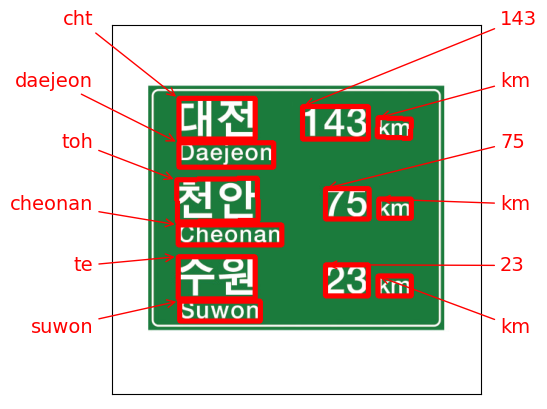
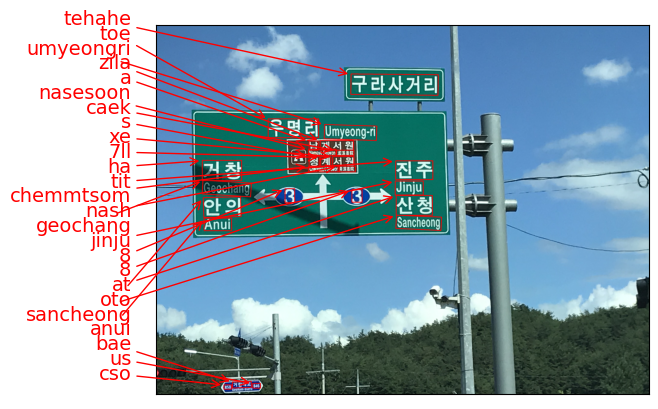
## tesseract
#### 텍스트 영역 검출: 텍스트가 뚜렸하지 않은 경우 정상적으로 검출하지 못함(첫번째 이미지만 정상검출됨)
#### 한국어 문자 검출: 텍스트영역 인식이 부정확 하여 정상적으로 동작하지 못함(일부 번역되는 부분이 존재함) 
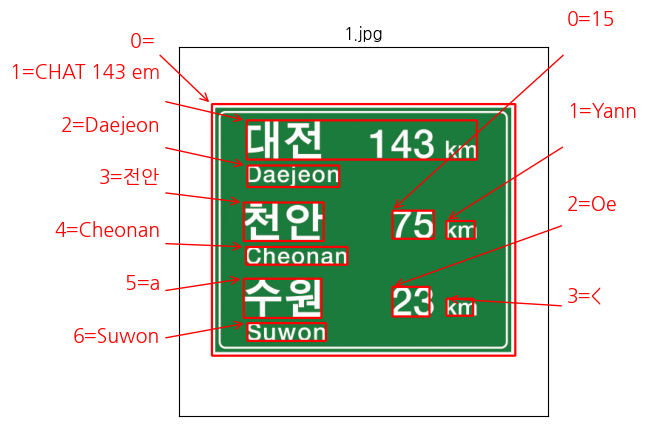
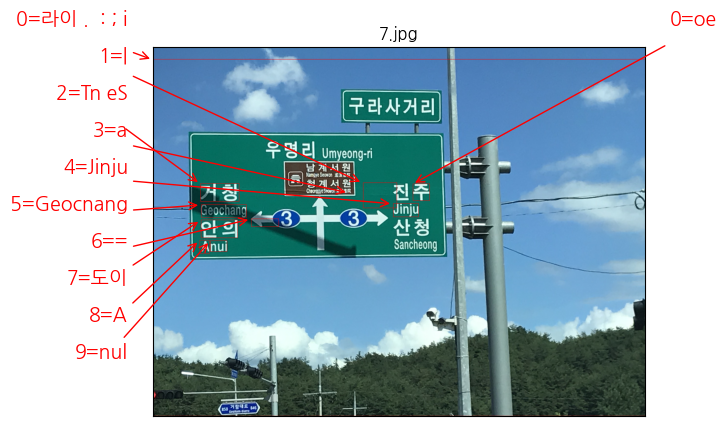

# Step4. 결과 분석과 결론 제시
우선 여러분들이 구현하고자 하는 서비스의 목적과 내용을 먼저 정리합니다. 여러분들이 검토한 OCR 모델들이 그 목적에 부합하는지 확인하기 위해 필요한 평가 기준을 제시합니다. 그 기준에 따라 위에서 정리한 테스트 결과를 분석하여 가장 나은 대안의 모델을 선정합니다.

## 서비스의 목적
- 도로 표지판의 문자를 해석하여 네비게이션의 현재 위치를 찾아내기 위한 서비스.
- GPS의 위치는 오차가 발생하므로 현재 자신의 위치를 검증하기 위해 도로 표지판을 해석하여 위치를 추정을 정확하게 하는 서비스를 만들고자 합니다.

## 검토한 OCR모델이 목적에 부합하는지 여부
- keras_ocr은 한글지원이 안되서 문제
- tesseract는 텍스트 위치 찾는 부분이 정상적으로 동작하지 않아서 문제

## 더 낳은 대안
- keras_ocr의 텍스트 위치 찾는 부분을 활용해서 좌표정보를 얻어온 후 tesseract를 통해 한글로 번역시키는 방식으로 개선시킬수있습니다.
- 아래와 같이 개선하여 이전보다 더 많은 내용을 번역시키는 성과를 얻었으나  crop_img를 수행할때 polygon으로 잘라내는 부분을 추가해야할것같습니다.
- 이상한 부분은 맨 처음 이미지는 왜 한글을 인식하지 못하는지 원인 분석해봐야 할 것 같습니다.
- 아무래도 한글인식관련 부분은 더 많은 학습이 필요해 보이고 햇빛에 의한 이미지 영향과 관련해서는 전처리 과정에서 흰색 부분만 뽑아내서 텍스트인식을 잘 할 수 있도록 해야할것 같습니다.

In [15]:
import numpy as np
import matplotlib.pyplot as plt
plt.rc('font', family='NanumGothic')

def annotate_detected_area_using_keras_ocr_data(title,img,prediction_groups): 

    img_width=img.shape[1]
    img_height=img.shape[0]
    d_area = []
    for i in range(len(prediction_groups[0])):
        array_area = prediction_groups[0][i][1]
        x,y = np.min(array_area,axis=0)
        x2,y2=np.max(array_area,axis=0)
        w = x2-x
        h = y2-y
        d_area.append((int(x),int(y),int(w),int(h)))
    # (x,y,w,h) -> subtuple[1]은 y값을 의미하므로 y값으로 정렬된다 작은값이 맨 위에 위치한다
    d_area = sorted(d_area, key=lambda subtuple:subtuple[1])
    left=[]
    right=[]
    for i in range(len(d_area)):
        (x, y, w, h) = d_area[i]
        if w==0:continue
        if h==0:continue
        if  x < img.shape[1]//2:
            left.append(d_area[i])
        else:
            right.append(d_area[i])
    
    if (len(left)<1) and (len(right)<1):
        print(f_name,'detected_area error=',d_area)
        return None
    
    _,ax = plt.subplots()
    ax.set_title(title)
    ax.set_yticks([])
    ax.set_xticks([])
    for side, text_areas in zip(["left","right"],[left,right]):
        for idx,(tx,ty,tw,th) in enumerate(text_areas):
            try:
                crop_img = img[ty:ty+th,tx:tx+tw]
                detect_str = pytesseract.image_to_string(cv2.cvtColor(crop_img,cv2.COLOR_BGR2RGB), lang='kor+eng',config='--oem 3 --psm 7')
                text_height = 1 - (idx/len(text_areas))
                img = cv2.rectangle(img, (tx, ty), (tx + tw, ty + th), (0, 0, 255), 2)
                
                
                ax.annotate(text = str(idx)+'='+detect_str,
                            xy = (tx/img_width,1-(ty/img_height)),
                            xytext=(-0.05 if side=='left' else 1.05, text_height),
                            xycoords="axes fraction",
                            arrowprops={"arrowstyle": "->", "color": "r"},
                            color="r",
                            fontsize=14,
                            horizontalalignment="right" if side == "left" else "left")
                ax.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
            except:
                print('text_area_error',tx,ty,tw,th)
    return ax

text_area_error 65 -4 128 32


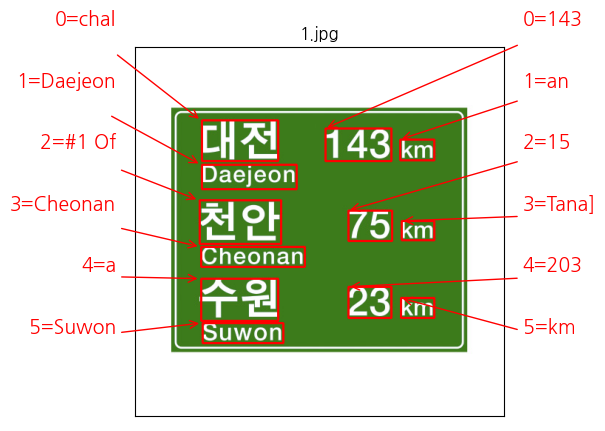

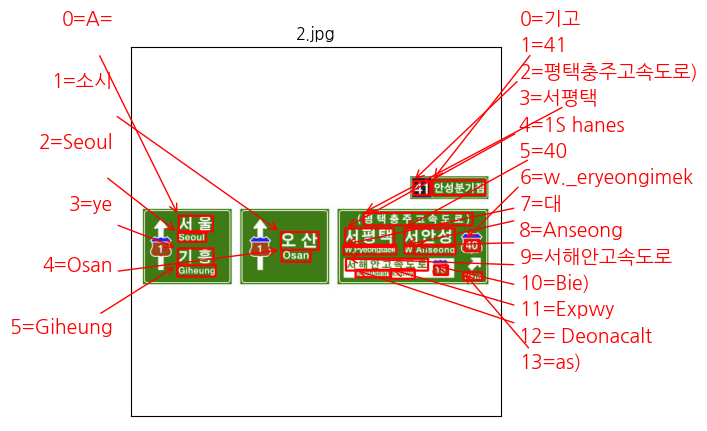

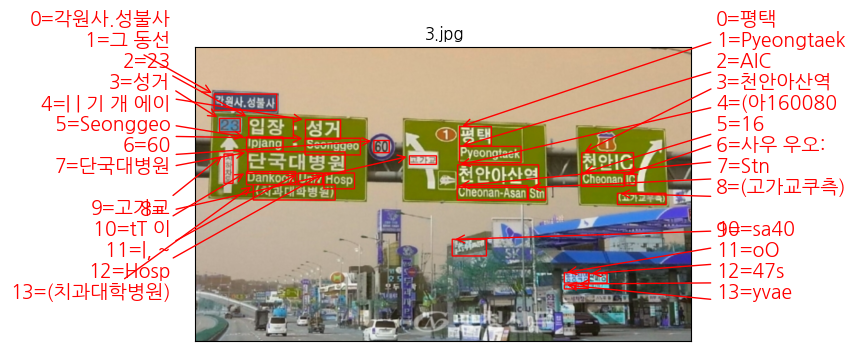

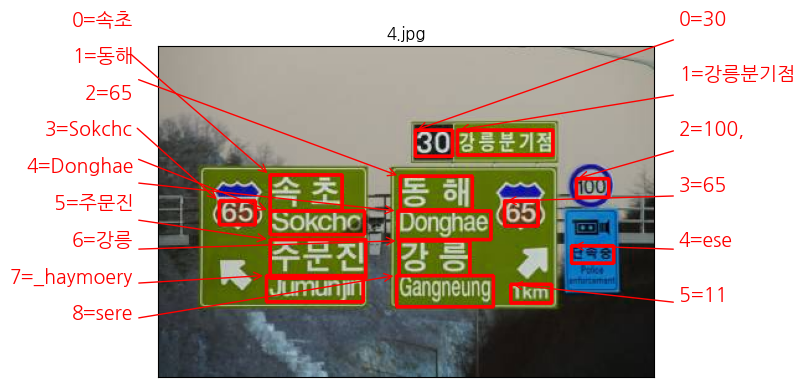

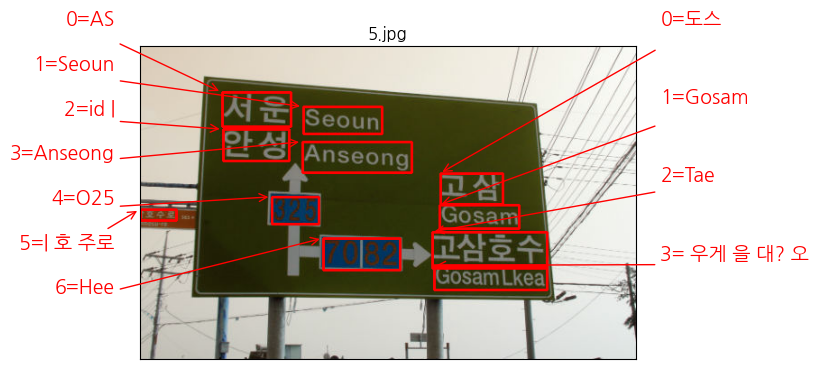

...

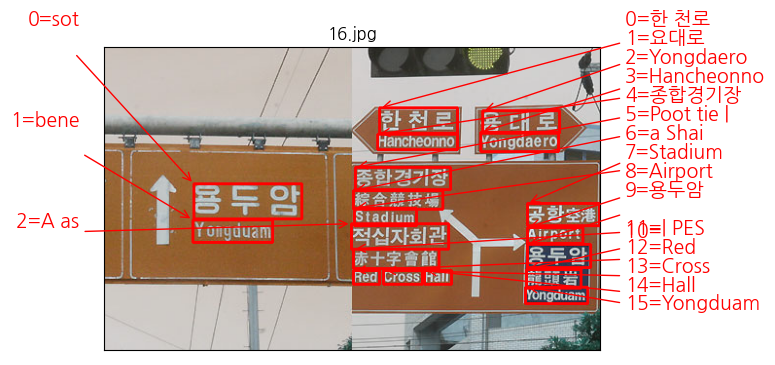

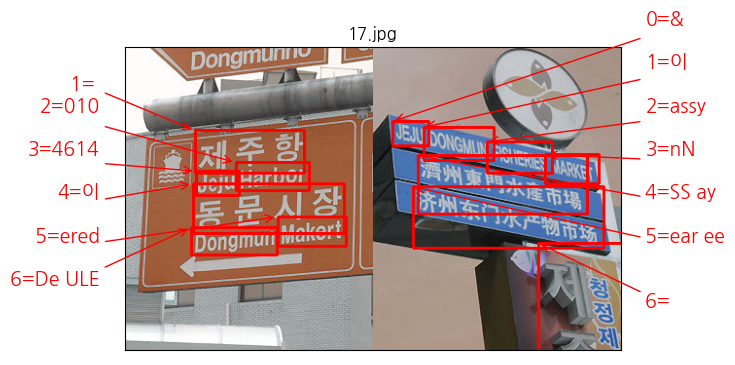

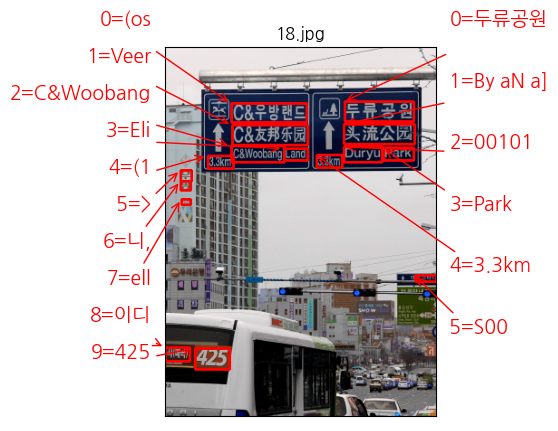

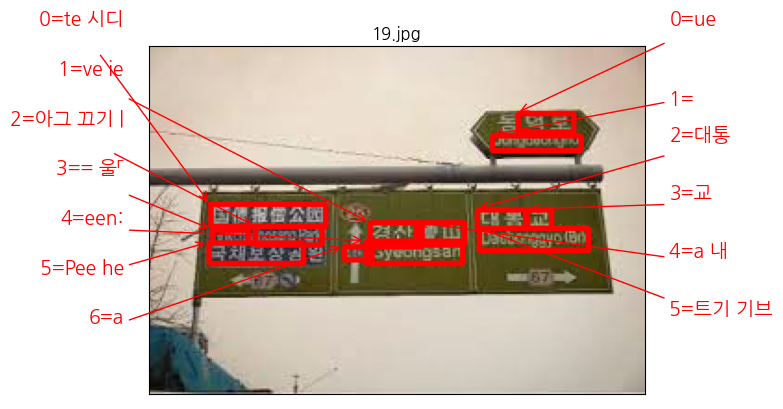

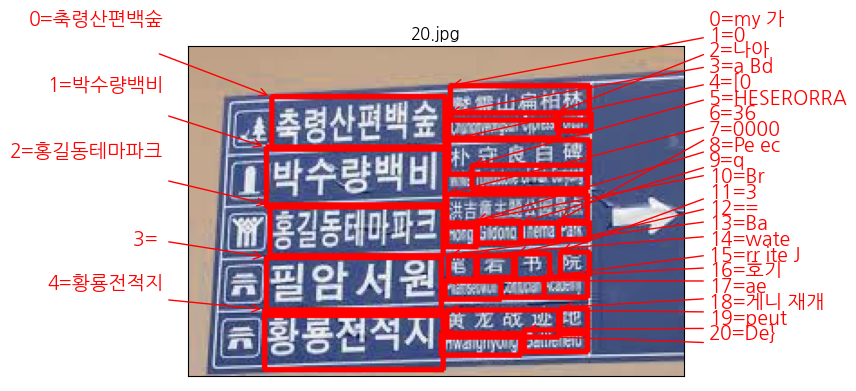

In [16]:
for f_name in path_list:
    img = keras_ocr.tools.read(f_name)
    prediction_groups = pipeline.recognize([img])
    annotate_detected_area_using_keras_ocr_data(f_name,img,prediction_groups)